# Analyzing Venues in the Suburbs of Johannesburg with Machine Learning

# Introduction

## This is an IBM Applied Data Science Project - The Battle of Neighborhoods 

Johannesburg, informally known as Jozi, Joburg, or "The City of Gold", is the largest city in South Africa and one of the 50 largest urban areas in the world. It is the provincial capital and largest city of Gauteng, which is the wealthiest province in South Africa. Johannesburg is the seat of the Constitutional Court, the highest court in South Africa. The city is located in the mineral-rich Witwatersrand range of hills and is the centre of large-scale gold and diamond trade. It was one of the host cities of the official tournament of the 2010 FIFA World Cup.

In this notebook, I analyzed different kinds of venues using the power of k-means clustering to seek the hidden patterns about the most visited venues in each of the suburbs within the City of Johannesburg municipality.

### Table of Contents

* [1. Exploring the Data Set](#1.-Exploring-the-Data-Set)
    * [1.1 Transforming the Data into a Pandas Data Frame](#1.1-Transforming-the-Data-into-a-Pandas-Data-Frame)    
* [2. Exploring suburbs in Johannesburg](#2.-Exploring-Suburbs-in-Johannesburg)
* [3. Analyzing Each Suburb](#3.-Analyzing-Each-Suburb)
* [4. Clustering Suburbs](#4.-Clustering-Suburbs)
* [5. Examining the Clusters](#5.-Examining-the-Clusters)
    * [5.1 Summary of Results in a Pandas Data Frame](#5.1-Summary-of-Results-in-a-Pandas-Data-Frame)

In [91]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

#!conda install -c conda-forge geopy --yes
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt

# import k-means from clustering stage
from sklearn.cluster import KMeans


#!conda install -c conda-forge folium=0.5.0 --yes
import folium # map rendering library

print('Libraries imported.')

Libraries imported.


# 1. Exploring the Data Set

The data set was taken from https://adi45.carto.com/tables/metropolitan_suburbs_region/public/map#/metropolitan_suburbs_region

In [ ]:
#import wget
#import os

#if os.path.exists('metropolitan_suburbs_region.geojson'):
#    os.remove('metropolitan_suburbs_region.geojson')

#wget.download('https://adi45.carto.com/tables/metropolitan_suburbs_region/public/map#/metropolitan_suburbs_region.geojson')

#print('\nData downloaded!')

In [ ]:
#with open('map') as json_data:
#    contents_jhb = json.load(json_data)

In [2]:
json_file_path = "C:/Users/vnbri/Documents/metropolitan_suburbs_region.geojson"

with open(json_file_path, 'r') as j:
     contents_jhb = json.loads(j.read())

In [ ]:
contents_jhb

The relevent data is coming from the _features_ key, it essentially a list of suburbs also known as neighborhoods. Thus it suffices to define a new variable that contains this data.

In [4]:
neighborhood_data = contents_jhb['features']

The first item of this list is  

In [5]:
neighborhood_data[0]

{'type': 'Feature',
 'geometry': {'type': 'MultiPolygon',
  'coordinates': [[[[28.073783, -26.343133],
     [28.071239, -26.351536],
     [28.068717, -26.350644],
     [28.06663, -26.351362],
     [28.065161, -26.352135],
     [28.064671, -26.35399],
     [28.064877, -26.355691],
     [28.062172, -26.357752],
     [28.062041, -26.358277],
     [28.060888, -26.359223],
     [28.059649, -26.358614],
     [28.057891, -26.35947],
     [28.057638, -26.359593],
     [28.055997, -26.358723],
     [28.055519, -26.358016],
     [28.054823, -26.35756],
     [28.053975, -26.357049],
     [28.053888, -26.357053],
     [28.053743, -26.357021],
     [28.05365, -26.357011],
     [28.053533, -26.356974],
     [28.053417, -26.356923],
     [28.053267, -26.356899],
     [28.053174, -26.35689],
     [28.053071, -26.356797],
     [28.052969, -26.35668],
     [28.052884, -26.35654],
     [28.052796, -26.356395],
     [28.052777, -26.356344],
     [28.052703, -26.356297],
     [28.052661, -26.356218],
     

## 1.1 Transforming the Data into a Pandas Data Frame

The next task is essentially transforming this data of nested Python dictionaries into a pandas dataframe. The first step is to create an empty pandas data frame.

In [6]:
# define the dataframe columns
column_names = ['Province', 'District', 'Local_municipality','Main Place', 'Suburb','Metro','Latitude','Longitude'] 

# instantiate the dataframe
neighborhoods = pd.DataFrame(columns=column_names)

Then we have to examine the empty dataframe to make sure that the columns are as intended.

In [7]:
neighborhoods

,Province,District,Local_municipality,Main Place,Suburb,Metro,Latitude,Longitude


In [8]:
for data in neighborhood_data:
    province = data['properties']['province']
    district = data['properties']['district_m']
    local_muni_name = suburb_name = data['properties']['local_muni'] 
    main_place = data['properties']['main_place']
    suburb_name = data['properties']['suburb_nam']
    metro = data['properties']['metro']
    
    suburb_latlon = data['geometry']['coordinates']
    suburb_lat = suburb_latlon[0][0][0][1]
    suburb_lon = suburb_latlon[0][0][0][0]
    neighborhoods = neighborhoods.append({'Province': province,
                                          'District': district,
                                          'Local_municipality': local_muni_name,
                                          'Main place': main_place,
                                          'Suburb': suburb_name,
                                          'Metro': metro,
                                          'Latitude': suburb_lat,
                                          'Longitude': suburb_lon}, ignore_index=True)

In [9]:
neighborhoods.head()

,Province,District,Local_municipality,Main Place,Suburb,Metro,Latitude,Longitude,Main place
0,Gauteng,Sedibeng,Midvaal,NaN,Brenkondown,Johannesburg,-26.343133,28.073783,Alberton
1,Gauteng,Sedibeng,Lesedi,NaN,Masetjhaba View,Johannesburg,-26.388533,28.384250,Duduza
2,Gauteng,Sedibeng,Lesedi,NaN,Sonstraal AH,Johannesburg,-26.406613,28.361255,Sonstraal
3,Gauteng,West Rand,Mogale City,NaN,Ruimsig Noord,Johannesburg,-26.075359,27.865240,Krugersdorp
4,Gauteng,Ekurhuleni,Ekurhuleni,NaN,Germiston Ext 3,Johannesburg,-26.214897,28.181906,Germiston


It is quit obvious that we need to get reed of the main place column with missing values. 

In [10]:
neighborhoods = neighborhoods.drop(neighborhoods.columns[3], axis=1)
neighborhoods.head()

,Province,District,Local_municipality,Suburb,Metro,Latitude,Longitude,Main place
0,Gauteng,Sedibeng,Midvaal,Brenkondown,Johannesburg,-26.343133,28.073783,Alberton
1,Gauteng,Sedibeng,Lesedi,Masetjhaba View,Johannesburg,-26.388533,28.384250,Duduza
2,Gauteng,Sedibeng,Lesedi,Sonstraal AH,Johannesburg,-26.406613,28.361255,Sonstraal
3,Gauteng,West Rand,Mogale City,Ruimsig Noord,Johannesburg,-26.075359,27.865240,Krugersdorp
4,Gauteng,Ekurhuleni,Ekurhuleni,Germiston Ext 3,Johannesburg,-26.214897,28.181906,Germiston


So it turns out that all the rows have the required information for now. Also:

In [11]:
print('The dataframe has {} local municipalities and {} suburbs.'.format(
        len(neighborhoods['Local_municipality'].unique()),
        neighborhoods.shape[0]
    )
)

The dataframe has 238 local municipalities and 3598 suburbs.


### The geopy library is used to get the latitude and longitude values of Johannesburg.

In [12]:
address = 'Johannesburg'

geolocator = Nominatim(user_agent="jhb_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Johannesburg are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of Johannesburg are -26.205, 28.049722.


### Folium is used to create a map of Johannesburg with suburbs superimposed on top.

In [13]:
# create map of Johannesburg using latitude and longitude values
map_johannesburg = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, local_municipality, suburb in zip(neighborhoods['Latitude'], neighborhoods['Longitude'], neighborhoods['Local_municipality'], neighborhoods['Suburb']):
    label = '{}, {}'.format(suburb, local_municipality)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_johannesburg)  
    
map_johannesburg

Folium is a great visualization library. Feel free to zoom into the above map, and click on each circle mark to reveal the name of the suburb and its respective local municipality.

Analyzing all 3598 suburbs of Johannesburg shown on the map and their nearby venues will be computationally expensive. Thus I will focus on the _City of Johannesburg_ **local municipality** only. Furthermore, this is the richest municipality in South Africa. 

In [14]:
city_of_jhb = neighborhoods[neighborhoods['Local_municipality'] == 'City of Johannesburg'].reset_index(drop=True)
city_of_jhb.head()

,Province,District,Local_municipality,Suburb,Metro,Latitude,Longitude,Main place
0,Gauteng,City of Johannesburg,City of Johannesburg,Lone Hill,Johannesburg,-26.009590,28.037358,Sandton
1,Gauteng,City of Johannesburg,City of Johannesburg,Far East Bank Ext,Johannesburg,-26.097029,28.113296,Alexandra
2,Gauteng,City of Johannesburg,City of Johannesburg,Fairwood,Johannesburg,-26.168411,28.086231,Johannesburg
3,Gauteng,City of Johannesburg,City of Johannesburg,Comptonville,Johannesburg,-26.277225,27.965573,Johannesburg
4,Gauteng,City of Johannesburg,City of Johannesburg,Vandia Grove,Johannesburg,-26.070525,27.992506,Randburg


In [15]:
a= 3598 - city_of_jhb.shape[0]
print('The city of johannesburg dataframe {} suburbs, which is {} less than the suburbs in johannesburg'.format(city_of_jhb.shape[0], a))

The city of johannesburg dataframe 659 suburbs, which is 2939 less than the suburbs in johannesburg


Getting the geographical coordinates of the City of Johannesburg municipality: 

In [16]:
address = 'City of johannesburg'

geolocator = Nominatim(user_agent="jhb_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of the City of Johannesburg are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of the City of Johannesburg are -26.205, 28.049722.


Creating the map for the City of Johannesburg municipality:

In [17]:
# create map of Manhattan using latitude and longitude values
map_city_of_jhb = folium.Map(location=[latitude, longitude], zoom_start=11)

# add markers to map
for lat, lng, label in zip(city_of_jhb['Latitude'], city_of_jhb['Longitude'], city_of_jhb['Suburb']):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_city_of_jhb)  
    
map_city_of_jhb

### Foursquare credentials and version

In [18]:
CLIENT_ID = 'UQZN4ASKMHNABHR1I03X5AVHFFCFLYVVUODCNBYO21LWIV3G' # your Foursquare ID
CLIENT_SECRET = 'DNEEYNI1LBE1ANGDKPQBC3J4VGQKDGYD3VRUQYWO0UFGQESR' # your Foursquare Secret
VERSION = '20200807' # Foursquare API version

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: UQZN4ASKMHNABHR1I03X5AVHFFCFLYVVUODCNBYO21LWIV3G
CLIENT_SECRET:DNEEYNI1LBE1ANGDKPQBC3J4VGQKDGYD3VRUQYWO0UFGQESR


#### The first suburb in the data frame is 

In [19]:
city_of_jhb.loc[0, 'Suburb']

'Lone Hill'

#### And it's latitude and longitude coordinates are 

In [20]:
sub_latitude = city_of_jhb.loc[0, 'Latitude'] # suburb latitude value
sub_longitude = city_of_jhb.loc[0, 'Longitude'] # suburb longitude value

sub_name = city_of_jhb.loc[0, 'Suburb'] # suburb name

print('Latitude and longitude values of {} are {}, {}.'.format(sub_name, 
                                                               sub_latitude, 
                                                               sub_longitude))

Latitude and longitude values of Lone Hill are -26.00959, 28.037358.


#### Getting the top 100 venues that are in Lone Hill within a radius of 500 meters

The first step is to create the GET request URL. 

In [21]:
# type your answer here
LIMIT=100
#search_query = 'Brenkondown'
radius = 500
#print(search_query + ' .... OK!')


url = 'https://api.foursquare.com/v2/venues/search?client_id={}&client_secret={}&ll={},{}&v={}&radius={}&limit={}'.format(CLIENT_ID, CLIENT_SECRET, sub_latitude, sub_longitude, VERSION, radius, LIMIT)
url

'https://api.foursquare.com/v2/venues/search?client_id=UQZN4ASKMHNABHR1I03X5AVHFFCFLYVVUODCNBYO21LWIV3G&client_secret=DNEEYNI1LBE1ANGDKPQBC3J4VGQKDGYD3VRUQYWO0UFGQESR&ll=-26.00959,28.037358&v=20200807&radius=500&limit=100'

#### Sending the GET request and displaying the resutls

In [22]:
results = requests.get(url).json()
results

{'meta': {'code': 200, 'requestId': '5f2d7268407e071762947508'},
 'response': {'venues': [{'id': '4cd0220b5b5ca35da3fb79f0',
    'name': 'Land Rover Experience',
    'location': {'lat': -26.012372732436205,
     'lng': 28.03845772369559,
     'labeledLatLngs': [{'label': 'display',
       'lat': -26.012372732436205,
       'lng': 28.03845772369559}],
     'distance': 328,
     'cc': 'ZA',
     'country': 'iNingizimu Afrika',
     'formattedAddress': ['iNingizimu Afrika']},
    'categories': [{'id': '4bf58dd8d48988d162941735',
      'name': 'Other Great Outdoors',
      'pluralName': 'Other Great Outdoors',
      'shortName': 'Other Outdoors',
      'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/parks_outdoors/outdoors_',
       'suffix': '.png'},
      'primary': True}],
    'referralId': 'v-1596813924',
    'hasPerk': False},
   {'id': '4e6ded1d18380b4aac2fd789',
    'name': 'Crawford College Lonehill',
    'location': {'lat': -26.010777570887644,
     'lng': 28.0310192638

All the relevent information is in the **items** key, but first let's define a function 'get_category_type'

In [23]:
# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

The json file can now be cleaned and structure it into a pandas dataframe.

In [24]:
venues = results['response']['venues']
nearby_venues = pd.json_normalize(venues) # flatten JSON
nearby_venues.head()
# filter columns
filtered_columns = ['name', 'categories', 'location.lat', 'location.lng']
nearby_venues =nearby_venues.loc[:, filtered_columns]

# filter the category for each row
nearby_venues['categories'] = nearby_venues.apply(get_category_type, axis=1)

# clean columns
nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]

nearby_venues.head()

,name,categories,lat,lng
0,Land Rover Experience,Other Great Outdoors,-26.012373,28.038458
1,Crawford College Lonehill,College & University,-26.010778,28.031019
2,Toscana,None,-26.016094,28.031106
3,TKDS,None,-26.016517,28.029121
4,Veranda House,Bed & Breakfast,-26.007244,28.037150


In [25]:
print('{} venues were returned by Foursquare.'.format(nearby_venues.shape[0]))

100 venues were returned by Foursquare.


# 2. Exploring Suburbs in Johannesburg

### Creating a function to repeat the same process to *all* the suburbs in the City of Johannesburg municipality.

In [26]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Suburb', 
                  'Suburb Latitude', 
                  'Suburb Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

### The code below will run the above function on each suburb and create a new dataframe called jhb_venues.

In [27]:
jhb_venues = getNearbyVenues(names=city_of_jhb['Suburb'],
                                   latitudes=city_of_jhb['Latitude'],
                                   longitudes=city_of_jhb['Longitude']);

Lone Hill
Far East Bank Ext
Fairwood
Comptonville
Vandia Grove
Randpark Ridge
Jacanlee
East Town
Dobsonville Ext 1
Naledi Ext 1
Bryanston
Woodmead
Edenburg
Sandown
Fairway
Alexandra Ext 66
Alexandra Ext 56
Alexandra Ext 44
Alexandra Ext 70
Alexandra Ext 33
Gresswold
Alexandra Ext 48
Norscot
Alexandra Ext 43
Far East Bank
Alexandra Ext 16
Alexandra Ext 27
Sunninghill
Alexandra Ext 60
Crystal Gardens
Chrisville
Formain
Judith's Paarl
Highlands
Lyndhurst
Dunsevern
Dorelan
Vrededorp
Inadan AH
Sol Plaatjie
Zonnehoewe AH
Radiokop
Kloofendal
Meadowlands West Zone 6
Molapo
Dobsonville
Bloubosrand
Northworld AH
Kliptown
Alexandra Ext 53
Glensan
Stratford
Simba
Linbro Park AH
Bramley North
Alexandra Ext 36
Alexandra Ext 57
Tinswalo Country and Equestrian Estate
North Champagne Estates AH
Wynberg
Buccleuch
Fourways
Moodie Hill
Modderfontein AH
Victoria
Lyme Park
Eastgate
Sunset Acres
Lombardy West
Chislehurston
Raumarais Park
Forest Town
Rembrandt Ridge
Viewcrest
Percelia Estate
New Doornfontein


Zola
Jabulani
Lenasia Ext 2
Doornkop 1
Dobsonville Ext 3
Tladi
Emdeni
Jabavu
Pimville Zone 2
Moroka
Mofolo Central
Pimville Zone 1
Chris Hani
Pimville Zone 8
Pimville Zone 5
Dhlamini
Motsoaledi
Mapetla
Protea Glen
Phiri
Naledi Ext 2
Chiawelo Ext 3
Senaoane
Protea North
Chiawelo Ext 2
Chiawelo
Chiawelo Ext 4 & 5
Anchorville
Thembalihle
Protea South
Lenasia Ext 10
Unaville AH
Lenasia South Ext 4
Lenasia South Ext 1
Ennerdale Ext 3
Ennerdale Ext 2
Ennerdale Ext 1
Mid-Ennerdale
Ennerdale South
Finetown
Kapok Informal
Ennerdale Ext 8
Lawley Ext 2
Sweetwaters


In [28]:
print(jhb_venues.shape)
jhb_venues.head()

(2190, 7)


,Suburb,Suburb Latitude,Suburb Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Lone Hill,-26.009590,28.037358,Thatchers Pub & Grill,-26.012798,28.039033,Beer Garden
1,Far East Bank Ext,-26.097029,28.113296,1st Chiken,-26.098520,28.115842,Food
2,Far East Bank Ext,-26.097029,28.113296,Rona Rea Rata Trading — Spaza,-26.097686,28.116784,Convenience Store
3,Far East Bank Ext,-26.097029,28.113296,Altrek Alexandra,-26.099446,28.109430,Soccer Field
4,Fairwood,-26.168411,28.086231,Sylvia Pass Market,-26.170954,28.089495,Flea Market


In [29]:
jhb_venues.groupby('Suburb').count()

,Suburb Latitude,Suburb Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Suburb,,,,,,
Abbotsford,3,3,3,3,3,3
Aeroton,2,2,2,2,2,2
Alan Manor,3,3,3,3,3,3
Albertskroon,2,2,2,2,2,2
Albertville,3,3,3,3,3,3
Aldara Park,12,12,12,12,12,12
Alexandra Ext 1,4,4,4,4,4,4
Alexandra Ext 10,4,4,4,4,4,4
Alexandra Ext 11,5,5,5,5,5,5


In [30]:
print('There are {} uniques categories.'.format(len(jhb_venues['Venue Category'].unique())))

There are 229 uniques categories.


# 3. Analyzing Each Suburb

In [31]:
# one hot encoding
jhb_onehot = pd.get_dummies(jhb_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
jhb_onehot['Suburb'] = jhb_venues['Suburb'] 

# move neighborhood column to the first column
fixed_columns = [jhb_onehot.columns[-1]] + list(jhb_onehot.columns[:-1])
jhb_onehot = jhb_onehot[fixed_columns]

jhb_onehot.head()

,Suburb,Accessories Store,Afghan Restaurant,African Restaurant,Airport,Airport Terminal,American Restaurant,Antique Shop,Arcade,Argentinian Restaurant,Art Gallery,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Bakery,Bar,Baseball Field,Basketball Court,Bed & Breakfast,Beer Garden,Bistro,Bookstore,Boutique,Bowling Green,Breakfast Spot,Brewery,Bridal Shop,Burger Joint,Burrito Place,Bus Station,Bus Stop,Business Service,Butcher,Café,Camera Store,Candy Store,Caribbean Restaurant,Casino,Chinese Restaurant,Church,Clothing Store,Cocktail Bar,Coffee Shop,Concert Hall,Construction & Landscaping,Convenience Store,Convention Center,Cosmetics Shop,Coworking Space,Cricket Ground,Cupcake Shop,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Diner,Dog Run,Donut Shop,Eastern European Restaurant,Electronics Store,English Restaurant,Ethiopian Restaurant,Event Space,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Film Studio,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Truck,Football Stadium,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,General Entertainment,Gift Shop,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gun Range,Gym,Gym / Fitness Center,Hardware Store,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hostel,Hotel,Hotel Bar,Housing Development,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Insurance Office,Italian Restaurant,Japanese Restaurant,Juice Bar,Lake,Latin American Restaurant,Lawyer,Liquor Store,Locksmith,Lounge,Market,Medical Supply Store,Mediterranean Restaurant,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Motel,Motorcycle Shop,Motorsports Shop,Movie Theater,Moving Target,Multiplex,Museum,Music Store,Music Venue,New American Restaurant,Nightclub,Office,Optical Shop,Other Nightlife,Other Repair Shop,Outdoors & Recreation,Paella Restaurant,Paper / Office Supplies Store,Park,Performing Arts Venue,Pet Store,Pharmacy,Photography Studio,Pizza Place,Platform,Playground,Plaza,Pool,Pool Hall,Portuguese Restaurant,Print Shop,Professional & Other Places,Pub,Public Art,Racetrack,Radio Station,Recording Studio,Rental Car Location,Rental Service,Residential Building (Apartment / Condo),Resort,Rest Area,Restaurant,River,Road,Rock Climbing Spot,Rock Club,Rugby Pitch,Sandwich Place,Scenic Lookout,Science Museum,Sculpture Garden,Seafood Restaurant,Shop & Service,Shopping Mall,Shopping Plaza,Skate Park,Skating Rink,Snack Place,Soccer Field,Soccer Stadium,South Indian Restaurant,Southern / Soul Food Restaurant,Spa,Speakeasy,Sporting Goods Shop,Sports Bar,Sports Club,Stables,Stadium,Steakhouse,Student Center,Supermarket,Sushi Restaurant,Tea Room,Tennis Court,Thai Restaurant,Theater,Theme Park,Thrift / Vintage Store,Track Stadium,Trail,Train Station,Tunnel,Turkish Restaurant,Vegetarian / Vegan Restaurant,Video Store,Vietnamese Restaurant,Water Park,Whisky Bar,Wine Bar,Women's Store,Yoga Studio
0,Lone Hill,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,Far East Bank Ext,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

In [32]:
jhb_onehot.shape

(2190, 230)

### Next, the code below groups rows by suburbs and by taking the mean of the frequency of occurrence of each category

In [33]:
jhb_grouped = jhb_onehot.groupby('Suburb').mean().reset_index()
jhb_grouped

,Suburb,Accessories Store,Afghan Restaurant,African Restaurant,Airport,Airport Terminal,American Restaurant,Antique Shop,Arcade,Argentinian Restaurant,Art Gallery,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Bakery,Bar,Baseball Field,Basketball Court,Bed & Breakfast,Beer Garden,Bistro,Bookstore,Boutique,Bowling Green,Breakfast Spot,Brewery,Bridal Shop,Burger Joint,Burrito Place,Bus Station,Bus Stop,Business Service,Butcher,Café,Camera Store,Candy Store,Caribbean Restaurant,Casino,Chinese Restaurant,Church,Clothing Store,Cocktail Bar,Coffee Shop,Concert Hall,Construction & Landscaping,Convenience Store,Convention Center,Cosmetics Shop,Coworking Space,Cricket Ground,Cupcake Shop,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Diner,Dog Run,Donut Shop,Eastern European Restaurant,Electronics Store,English Restaurant,Ethiopian Restaurant,Event Space,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Film Studio,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Truck,Football Stadium,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,General Entertainment,Gift Shop,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gun Range,Gym,Gym / Fitness Center,Hardware Store,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hostel,Hotel,Hotel Bar,Housing Development,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Insurance Office,Italian Restaurant,Japanese Restaurant,Juice Bar,Lake,Latin American Restaurant,Lawyer,Liquor Store,Locksmith,Lounge,Market,Medical Supply Store,Mediterranean Restaurant,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Motel,Motorcycle Shop,Motorsports Shop,Movie Theater,Moving Target,Multiplex,Museum,Music Store,Music Venue,New American Restaurant,Nightclub,Office,Optical Shop,Other Nightlife,Other Repair Shop,Outdoors & Recreation,Paella Restaurant,Paper / Office Supplies Store,Park,Performing Arts Venue,Pet Store,Pharmacy,Photography Studio,Pizza Place,Platform,Playground,Plaza,Pool,Pool Hall,Portuguese Restaurant,Print Shop,Professional & Other Places,Pub,Public Art,Racetrack,Radio Station,Recording Studio,Rental Car Location,Rental Service,Residential Building (Apartment / Condo),Resort,Rest Area,Restaurant,River,Road,Rock Climbing Spot,Rock Club,Rugby Pitch,Sandwich Place,Scenic Lookout,Science Museum,Sculpture Garden,Seafood Restaurant,Shop & Service,Shopping Mall,Shopping Plaza,Skate Park,Skating Rink,Snack Place,Soccer Field,Soccer Stadium,South Indian Restaurant,Southern / Soul Food Restaurant,Spa,Speakeasy,Sporting Goods Shop,Sports Bar,Sports Club,Stables,Stadium,Steakhouse,Student Center,Supermarket,Sushi Restaurant,Tea Room,Tennis Court,Thai Restaurant,Theater,Theme Park,Thrift / Vintage Store,Track Stadium,Trail,Train Station,Tunnel,Turkish Restaurant,Vegetarian / Vegan Restaurant,Video Store,Vietnamese Restaurant,Water Park,Whisky Bar,Wine Bar,Women's Store,Yoga Studio
0,Abbotsford,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.00,0.000000,0.000000,0.000000,0.000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.333333,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.00,0.000000,0.000000,0.000000,0.000,0.000000

In [34]:
jhb_grouped.shape

(516, 230)

### Preprocessing

In [35]:
from sklearn.preprocessing import StandardScaler

X = jhb_grouped.values[:,1:]
X = np.nan_to_num(X)
cluster_dataset = StandardScaler().fit_transform(X)
cluster_dataset

array([[-0.04406526, -0.15129299, -0.19619296, ..., -0.05625322,
        -0.072075  , -0.04406526],
       [-0.04406526, -0.15129299, -0.19619296, ..., -0.05625322,
        -0.072075  , -0.04406526],
       [-0.04406526, -0.15129299, -0.19619296, ..., -0.05625322,
        -0.072075  , -0.04406526],
       ...,
       [-0.04406526, -0.15129299, -0.19619296, ..., -0.05625322,
        -0.072075  , -0.04406526],
       [-0.04406526, -0.15129299, -0.19619296, ..., -0.05625322,
        -0.072075  , -0.04406526],
       [-0.04406526, -0.15129299, -0.19619296, ..., -0.05625322,
        -0.072075  , -0.04406526]])

### Print each suburb along with the top 5 most common venues

In [36]:
num_top_venues = 5

for hood in jhb_grouped['Suburb']:
    print("----"+hood+"----")
    temp = jhb_grouped[jhb_grouped['Suburb'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Abbotsford----
                                      venue  freq
0  Residential Building (Apartment / Condo)  0.33
1                              Soccer Field  0.33
2                          Business Service  0.33
3                         Accessories Store  0.00
4                                  Pharmacy  0.00


----Aeroton----
                        venue  freq
0  Construction & Landscaping   0.5
1              History Museum   0.5
2           Accessories Store   0.0
3          Photography Studio   0.0
4                      Office   0.0


----Alan Manor----
               venue  freq
0  Convenience Store  0.33
1      Shopping Mall  0.33
2                Spa  0.33
3  Accessories Store  0.00
4          Pet Store  0.00


----Albertskroon----
               venue  freq
0         Theme Park   0.5
1        Candy Store   0.5
2  Accessories Store   0.0
3          Nightclub   0.0
4             Office   0.0


----Albertville----
                venue  freq
0         Pizza Place  0.33
1

4   Accessories Store  0.00


----Bloubosrand----
                        venue  freq
0                     Stables   0.5
1  Construction & Landscaping   0.5
2           Accessories Store   0.0
3                    Pharmacy   0.0
4                   Nightclub   0.0


----Booysens----
                        venue  freq
0  Construction & Landscaping   1.0
1           Accessories Store   0.0
2          Photography Studio   0.0
3                   Nightclub   0.0
4                      Office   0.0


----Booysens Reserve----
                        venue  freq
0                Burger Joint   0.5
1  Construction & Landscaping   0.5
2           Accessories Store   0.0
3          Photography Studio   0.0
4                      Office   0.0


----Boskruin----
                venue  freq
0        Burger Joint  0.14
1       Shopping Mall  0.14
2         Pizza Place  0.14
3  Seafood Restaurant  0.14
4        Liquor Store  0.14


----Bosmont----
                venue  freq
0      Cricket Ground  

4          Nightclub   0.0


----East Town----
               venue  freq
0      Bowling Green  0.25
1              Hotel  0.25
2     Baseball Field  0.25
3                Bar  0.25
4  Accessories Store  0.00


----Eastgate----
                    venue  freq
0  Furniture / Home Store  0.29
1             Gas Station  0.14
2                    Road  0.14
3                    Café  0.14
4        Motorsports Shop  0.14


----Edenburg----
               venue  freq
0    Bed & Breakfast   1.0
1  Accessories Store   0.0
2           Pharmacy   0.0
3          Nightclub   0.0
4             Office   0.0


----Electron----
                venue  freq
0        Food Service   0.5
1   Convenience Store   0.5
2   Accessories Store   0.0
3  Photography Studio   0.0
4              Office   0.0


----Emdeni----
                     venue  freq
0        Fish & Chips Shop  0.67
1      Fried Chicken Joint  0.33
2  New American Restaurant  0.00
3                   Office  0.00
4             Optical Shop  0.

4          Photography Studio  0.00


----Hyde Park----
                       venue  freq
0              Deli / Bodega  0.29
1         Italian Restaurant  0.29
2  Middle Eastern Restaurant  0.14
3          Convention Center  0.14
4             Shopping Plaza  0.14


----Illovo----
               venue  freq
0               Café  0.25
1            Airport  0.25
2              Hotel  0.25
3        Art Gallery  0.25
4  Accessories Store  0.00


----Industria North----
                     venue  freq
0           Breakfast Spot   0.5
1                Pet Store   0.5
2                 Pharmacy   0.0
3  New American Restaurant   0.0
4                Nightclub   0.0


----Industria West----
                        venue  freq
0  Construction & Landscaping   0.5
1               Shopping Mall   0.5
2           Accessories Store   0.0
3                    Pharmacy   0.0
4                   Nightclub   0.0


----Jabavu----
                     venue  freq
0               Water Park   1.0
1      

4             Office   0.0


----Lenasia South Ext 4----
                  venue  freq
0           Gas Station  0.25
1                  Café  0.25
2  Fast Food Restaurant  0.25
3    Seafood Restaurant  0.25
4     Accessories Store  0.00


----Linbro Park AH----
                  venue  freq
0             Gift Shop   0.5
1  Medical Supply Store   0.5
2     Accessories Store   0.0
3              Pharmacy   0.0
4             Nightclub   0.0


----Linden----
                     venue  freq
0              Gas Station   1.0
1        Accessories Store   0.0
2                Pet Store   0.0
3  New American Restaurant   0.0
4                Nightclub   0.0


----Lindhaven----
                   venue  freq
0       Department Store  0.22
1     Seafood Restaurant  0.11
2         Breakfast Spot  0.11
3  Portuguese Restaurant  0.11
4                   Café  0.11


----Linksfield----
            venue  freq
0  Breakfast Spot  0.25
1     IT Services  0.25
2       Rest Area  0.25
3    Dessert Shop  0

4  New American Restaurant   0.0


----Modderfontein AH----
               venue  freq
0        Gas Station   0.5
1  Electronics Store   0.5
2  Accessories Store   0.0
3           Pharmacy   0.0
4          Nightclub   0.0


----Moffat View----
               venue  freq
0  Other Repair Shop  0.67
1       Food Service  0.33
2  Accessories Store  0.00
3        Music Venue  0.00
4          Nightclub  0.00


----Mofolo Central----
               venue  freq
0              Plaza   1.0
1  Accessories Store   0.0
2           Pharmacy   0.0
3          Nightclub   0.0
4             Office   0.0


----Mofolo North----
                venue  freq
0  African Restaurant  0.33
1         Supermarket  0.33
2                Park  0.33
3   Accessories Store  0.00
4           Pet Store  0.00


----Mofolo South----
               venue  freq
0        Bus Station  0.67
1               Park  0.33
2  Accessories Store  0.00
3           Pharmacy  0.00
4          Nightclub  0.00


----Moletsane----
           

4           Pharmacy   0.0


----Rembrandt Park----
                venue  freq
0    Department Store  0.33
1          Steakhouse  0.33
2       Shopping Mall  0.17
3  Seafood Restaurant  0.17
4         Music Venue  0.00


----Rembrandt Ridge----
               venue  freq
0        Gas Station   0.5
1      Shopping Mall   0.5
2  Accessories Store   0.0
3          Pet Store   0.0
4          Nightclub   0.0


----Reuven----
                        venue  freq
0  Construction & Landscaping   1.0
1           Accessories Store   0.0
2          Photography Studio   0.0
3                   Nightclub   0.0
4                      Office   0.0


----Rewlatch----
                     venue  freq
0              Gas Station   1.0
1        Accessories Store   0.0
2                Pet Store   0.0
3  New American Restaurant   0.0
4                Nightclub   0.0


----Richmond----
                venue  freq
0                Café  0.15
1       Deli / Bodega  0.15
2  Italian Restaurant  0.08
3          

4                   Nightclub   0.0


----Vrededorp----
               venue  freq
0     Cricket Ground  0.33
1            Stadium  0.33
2        Golf Course  0.33
3  Accessories Store  0.00
4          Pet Store  0.00


----Waterval Estate----
             venue  freq
0      Gas Station  0.11
1  Bed & Breakfast  0.11
2      Pizza Place  0.11
3      Fish Market  0.11
4       Playground  0.11


----Weltevredenpark----
               venue  freq
0                Pub   0.5
1        Coffee Shop   0.5
2  Accessories Store   0.0
3           Pharmacy   0.0
4          Nightclub   0.0


----Wendywood----
               venue  freq
0  Fish & Chips Shop  0.25
1      Moving Target  0.25
2    Motorcycle Shop  0.25
3         Hobby Shop  0.25
4           Pharmacy  0.00


----West Turffontein----
                venue  freq
0      Clothing Store   1.0
1   Accessories Store   0.0
2  Photography Studio   0.0
3           Nightclub   0.0
4              Office   0.0


----Westbury----
               venue  

### The function below sorts the venues in descending order.

In [37]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

A new dataframe is created and the top 10 venues for each suburb are displayed

In [38]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Suburb']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
suburbs_venues_sorted = pd.DataFrame(columns=columns)
suburbs_venues_sorted['Suburb'] = jhb_grouped['Suburb']

for ind in np.arange(jhb_grouped.shape[0]):
    suburbs_venues_sorted.iloc[ind, 1:] = return_most_common_venues(jhb_grouped.iloc[ind, :], num_top_venues)

suburbs_venues_sorted.head(5)

,Suburb,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Abbotsford,Soccer Field,Residential Building (Apartment / Condo),Business Service,Yoga Studio,Fast Food Restaurant,Food Truck,Food Service,Food Court,Food & Drink Shop,Food
1,Aeroton,Construction & Landscaping,History Museum,Yoga Studio,Film Studio,French Restaurant,Football Stadium,Food Truck,Food Service,Food Court,Food & Drink Shop
2,Alan Manor,Spa,Convenience Store,Shopping Mall,Fast Food Restaurant,Football Stadium,Food Truck,Food Service,Food Court,Food & Drink Shop,Food
3,Albertskroon,Theme Park,Candy Store,Film Studio,French Restaurant,Football Stadium,Food Truck,Food Service,Food Court,Food & Drink Shop,Food
4,Albertville,Hotel,Italian Restaurant,Pizza Place,Yoga Studio,Fast Food Restaurant,Football Stadium,Food Truck,Food Service,Food Court,Food & Drink Shop


# 4. Clustering Suburbs

The assignment "jhb_grouped_clustering = jhb_grouped.drop('Suburb', 1)" caused problems such as having an increasing silhouette score as the number of clusters increased. Preprocessiong was done to then have a smaller number of clusters to work with.

In [39]:
#preprocessed dataset
jhb_grouped_clustering = cluster_dataset

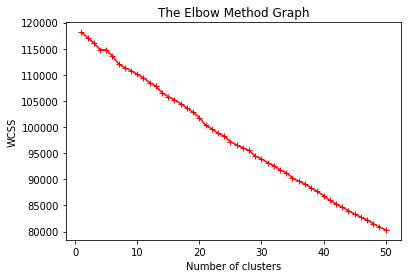

In [42]:
#Plotting the elbow graph
wcss=[]
for i in range(1,51): 
    kmeans = KMeans(n_clusters=i,random_state=0 ).fit(jhb_grouped_clustering)
    wcss.append(kmeans.inertia_)

#4.Plot the elbow graph
plt.plot(range(1,51),wcss,'r+-')
plt.title('The Elbow Method Graph')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

The elbow method doesn't help to find the optimal number of clusters k. In such a case, comparing the different silhouette score for each cluster on a graph becomes neccessary.

2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 

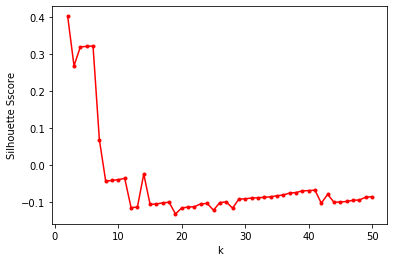

In [52]:
from sklearn.metrics import silhouette_score

sil_score = []
K_i = range(2,51)
# minimum 2 clusters required, to define dissimilarity
for k in K_i:
    print(k, end=' ')
    kmeans = KMeans(n_clusters = k, init='k-means++', random_state=3).fit(jhb_grouped_clustering)
    labels = kmeans.labels_
    sil_score.append(silhouette_score(jhb_grouped_clustering, labels, metric = 'euclidean'))

plt.plot(K_i, sil_score, 'r.-')
plt.xlabel('k')
plt.ylabel('Silhouette Sscore')
plt.show()

There are peaks at k = 2, k = 6 and k = 11. Choosing k = 2 could result in a loss of information (under segmenting) and choosing k = 11 could result in a loss of interpretability (oversegmenting). Thus k = 6 is a good value to choose in this context, however, k= 11 may also turn out to be a good value.

In [53]:
# set number of clusters
kclusters = 6

jhb_grouped_clustering = jhb_grouped.drop('Suburb', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, init='k-means++', random_state=3).fit(jhb_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([5, 2, 1, 5, 5, 1, 5, 5, 5, 5])

A new dataframe that includes the cluster as well as the top 10 venues for each suburb is created.

In [ ]:
#uncomment if you the data frame with 'ClusterLabels', already exists in the kernel.
#suburbs_venues_sorted=suburbs_venues_sorted.drop('ClusterLabels',axis=1)

In [54]:
# add clustering labels
suburbs_venues_sorted.insert(0, 'ClusterLabels', kmeans.labels_)

jhb_merged = city_of_jhb

# merge jhb_grouped with vity_of_jhb to add latitude/longitude for each neighborhood
jhb_merged = jhb_merged.join(suburbs_venues_sorted.set_index('Suburb'), on='Suburb')

jhb_merged.head() # check the last columns!

,Province,District,Local_municipality,Suburb,Metro,Latitude,Longitude,Main place,ClusterLabels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Gauteng,City of Johannesburg,City of Johannesburg,Lone Hill,Johannesburg,-26.009590,28.037358,Sandton,5.0,Beer Garden,Yoga Studio,Fish & Chips Shop,Fried Chicken Joint,French Restaurant,Football Stadium,Food Truck,Food Service,Food Court,Food & Drink Shop
1,Gauteng,City of Johannesburg,City of Johannesburg,Far East Bank Ext,Johannesburg,-26.097029,28.113296,Alexandra,5.0,Soccer Field,Convenience Store,Food,Yoga Studio,Film Studio,French Restaurant,Football Stadium,Food Truck,Food Service,Food Court
2,Gauteng,City of Johannesburg,City of Johannesburg,Fairwood,Johannesburg,-26.168411,28.086231,Johannesburg,5.0,Flea Market,Yoga Studio,Frozen Yogurt Shop,French Restaurant,Football Stadium,Food Truck,Food Service,Food Court,Food & Drink Shop,Food
3,Gauteng,City of Johannesburg,City of Johannesburg,Comptonville,Johannesburg,-26.277225,27.965573,Johannesburg,4.0,Restaurant,Yoga Studio,Fast Food Restaurant,French Restaurant,Football Stadium,Food Truck,Food Service,Food Court,Food & Drink Shop,Food
4,Gauteng,City of Johannesburg,City of Johannesburg,Vandia Grove,Johannesburg,-26.070525,27.992506,Randburg,5.0,Electronics Store,Gym / Fitness Center,Yoga Studio,Film Studio,French Restaurant,Football Stadium,Food Truck,Food Service,Food Court,Food & Drink Shop


In [55]:
jhb_merged.shape

(659, 19)

In [56]:
jhb_merged.dropna(inplace=True)
jhb_merged.shape

(516, 19)

The cluster labels must not be of type float in order to use folium to visualize the clusters

In [57]:
print('before',type(jhb_merged.ClusterLabels[0]))
jhb_merged.ClusterLabels = jhb_merged.ClusterLabels.astype('int64') 
print('after', type(jhb_merged.ClusterLabels[0]))

before <class 'numpy.float64'>
after <class 'numpy.int64'>


### Visualizing the clusters

In [58]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(jhb_merged['Latitude'], jhb_merged['Longitude'], jhb_merged['Suburb'], jhb_merged['ClusterLabels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

# 5. Examining the Clusters

The next process is to examine each cluster and determine the discriminating venue categories that distinguish each cluster.

## Cluster 0

In [79]:
c0=jhb_merged.loc[jhb_merged['ClusterLabels'] == 0, jhb_merged.columns[[3] + list(range(5, jhb_merged.shape[1]))]]
c0.head()

,Suburb,Latitude,Longitude,Main place,ClusterLabels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
26,Alexandra Ext 27,-26.110503,28.091723,Alexandra,0,Fast Food Restaurant,Shopping Mall,Pizza Place,Yoga Studio,Football Stadium,Food Truck,Food Service,Food Court,Food & Drink Shop,Food
28,Alexandra Ext 60,-26.100266,28.098973,Alexandra,0,Electronics Store,Health & Beauty Service,Fast Food Restaurant,Yoga Studio,Film Studio,French Restaurant,Football Stadium,Food Truck,Food Service,Food Court
31,Formain,-26.126431,28.107143,Johannesburg,0,Fast Food Restaurant,Shopping Mall,Film Studio,French Restaurant,Football Stadium,Food Truck,Food Service,Food Court,Food & Drink Shop,Food
59,Wynberg,-26.118746,28.083997,Sandton,0,Fast Food Restaurant,Furniture / Home Store,Rock Club,Yoga Studio,Football Stadium,Food Truck,Food Service,Food Court,Food & Drink Shop,Food
70,Raumarais Park,-26.121570,28.084548,Johannesburg,0,Fast Food Restaurant,Sporting Goods Shop,Rock Club,Yoga Studio,Football Stadium,Food Truck,Food Service,Food Court,Food & Drink Shop,Food


## Cluster 1

In [80]:
c1=jhb_merged.loc[jhb_merged['ClusterLabels'] == 1, jhb_merged.columns[[3] + list(range(5, jhb_merged.shape[1]))]]
c1.head()

,Suburb,Latitude,Longitude,Main place,ClusterLabels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
13,Sandown,-26.087667,28.077780,Sandton,1,Fast Food Restaurant,Gas Station,Café,Lounge,Gym / Fitness Center,Film Studio,Football Stadium,Food Truck,Food Service,Food Court
15,Alexandra Ext 66,-26.103185,28.089186,Alexandra,1,Grocery Store,Shopping Mall,Café,Fast Food Restaurant,Yoga Studio,Fish & Chips Shop,Football Stadium,Food Truck,Food Service,Food Court
20,Gresswold,-26.135250,28.086102,Johannesburg,1,Grocery Store,Seafood Restaurant,Burger Joint,Fried Chicken Joint,Bookstore,Cosmetics Shop,Gym,Food & Drink Shop,Flea Market,Flower Shop
24,Far East Bank,-26.105058,28.115809,Alexandra,1,Park,Bar,Shopping Mall,Fried Chicken Joint,Yoga Studio,Football Stadium,Food Truck,Food Service,Food Court,Food & Drink Shop
35,Dunsevern,-26.125715,28.120578,Johannesburg,1,Sporting Goods Shop,Gas Station,Shopping Mall,Liquor Store,Yoga Studio,Film Studio,Football Stadium,Food Truck,Food Service,Food Court


## Cluster 2

In [81]:
c2=jhb_merged.loc[jhb_merged['ClusterLabels'] == 2, jhb_merged.columns[[3] + list(range(5, jhb_merged.shape[1]))]]
c2.head()

,Suburb,Latitude,Longitude,Main place,ClusterLabels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
34,Lyndhurst,-26.125499,28.110219,Johannesburg,2,Theater,Construction & Landscaping,Shopping Mall,Fast Food Restaurant,Football Stadium,Food Truck,Food Service,Food Court,Food & Drink Shop,Food
46,Bloubosrand,-26.013998,27.971250,Randburg,2,Stables,Construction & Landscaping,Yoga Studio,Film Studio,French Restaurant,Football Stadium,Food Truck,Food Service,Food Court,Food & Drink Shop
82,Ophirton,-26.225705,28.031594,Johannesburg,2,Construction & Landscaping,Donut Shop,Yoga Studio,Film Studio,French Restaurant,Football Stadium,Food Truck,Food Service,Food Court,Food & Drink Shop
84,George Goch,-26.212807,28.078723,Johannesburg,2,Construction & Landscaping,Auto Garage,Furniture / Home Store,Yoga Studio,French Restaurant,Football Stadium,Food Truck,Food Service,Food Court,Food & Drink Shop
85,Reuven,-26.229010,28.031460,Johannesburg,2,Construction & Landscaping,Yoga Studio,Film Studio,French Restaurant,Football Stadium,Food Truck,Food Service,Food Court,Food & Drink Shop,Food


## Cluster 3

In [82]:
c3=jhb_merged.loc[jhb_merged['ClusterLabels'] == 3, jhb_merged.columns[[3] + list(range(5, jhb_merged.shape[1]))]]
c3.head()

,Suburb,Latitude,Longitude,Main place,ClusterLabels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
63,Modderfontein AH,-26.077607,28.118700,Sandton,3,Gas Station,Electronics Store,Yoga Studio,Film Studio,French Restaurant,Football Stadium,Food Truck,Food Service,Food Court,Food & Drink Shop
72,Rembrandt Ridge,-26.123675,28.122241,Johannesburg,3,Gas Station,Shopping Mall,Yoga Studio,Film Studio,Football Stadium,Food Truck,Food Service,Food Court,Food & Drink Shop,Food
199,Frankenwald,-26.081310,28.118437,Sandton,3,Gas Station,Flower Shop,Yoga Studio,Film Studio,French Restaurant,Football Stadium,Food Truck,Food Service,Food Court,Food & Drink Shop
317,Rewlatch,-26.239715,28.079267,Johannesburg,3,Gas Station,Yoga Studio,Film Studio,French Restaurant,Football Stadium,Food Truck,Food Service,Food Court,Food & Drink Shop,Food
393,Rosettenville,-26.243072,28.060358,Johannesburg,3,Gas Station,Fish & Chips Shop,Yoga Studio,Film Studio,French Restaurant,Football Stadium,Food Truck,Food Service,Food Court,Food & Drink Shop


## Cluster 4

In [83]:
c4=jhb_merged.loc[jhb_merged['ClusterLabels'] == 4, jhb_merged.columns[[3] + list(range(5, jhb_merged.shape[1]))]]
c4.head()

,Suburb,Latitude,Longitude,Main place,ClusterLabels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
3,Comptonville,-26.277225,27.965573,Johannesburg,4,Restaurant,Yoga Studio,Fast Food Restaurant,French Restaurant,Football Stadium,Food Truck,Food Service,Food Court,Food & Drink Shop,Food
5,Randpark Ridge,-26.086260,27.934907,Randburg,4,Restaurant,Yoga Studio,Fast Food Restaurant,French Restaurant,Football Stadium,Food Truck,Food Service,Food Court,Food & Drink Shop,Food
27,Sunninghill,-26.031678,28.081905,Sandton,4,Restaurant,Yoga Studio,Fast Food Restaurant,French Restaurant,Football Stadium,Food Truck,Food Service,Food Court,Food & Drink Shop,Food
40,Zonnehoewe AH,-26.065113,27.895665,Roodepoort,4,Restaurant,Yoga Studio,Fast Food Restaurant,French Restaurant,Football Stadium,Food Truck,Food Service,Food Court,Food & Drink Shop,Food
57,Tinswalo Country and Equestrian Estate,-26.031309,28.083337,Midrand,4,Restaurant,Yoga Studio,Fast Food Restaurant,French Restaurant,Football Stadium,Food Truck,Food Service,Food Court,Food & Drink Shop,Food


## Cluster 5

In [84]:
c5=jhb_merged.loc[jhb_merged['ClusterLabels'] == 5, jhb_merged.columns[[3] + list(range(5, jhb_merged.shape[1]))]]
c5.head()

,Suburb,Latitude,Longitude,Main place,ClusterLabels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Lone Hill,-26.009590,28.037358,Sandton,5,Beer Garden,Yoga Studio,Fish & Chips Shop,Fried Chicken Joint,French Restaurant,Football Stadium,Food Truck,Food Service,Food Court,Food & Drink Shop
1,Far East Bank Ext,-26.097029,28.113296,Alexandra,5,Soccer Field,Convenience Store,Food,Yoga Studio,Film Studio,French Restaurant,Football Stadium,Food Truck,Food Service,Food Court
2,Fairwood,-26.168411,28.086231,Johannesburg,5,Flea Market,Yoga Studio,Frozen Yogurt Shop,French Restaurant,Football Stadium,Food Truck,Food Service,Food Court,Food & Drink Shop,Food
4,Vandia Grove,-26.070525,27.992506,Randburg,5,Electronics Store,Gym / Fitness Center,Yoga Studio,Film Studio,French Restaurant,Football Stadium,Food Truck,Food Service,Food Court,Food & Drink Shop
6,Jacanlee,-26.120758,27.984863,Randburg,5,Bar,Bakery,Yoga Studio,Fruit & Vegetable Store,Fried Chicken Joint,French Restaurant,Football Stadium,Food Truck,Food Service,Food Court


In [85]:
specific_col_indices = [9,10,7,3]
specific_cols = [list(jhb_merged.columns.values)[i] for i in specific_col_indices]
specific_col_indices = [9,10,7,3]

In [86]:
for _ in specific_cols:
    print(c0[_].value_counts(ascending = False))
    print("---------------------------------------------")

Fast Food Restaurant    21
Cosmetics Shop           4
Fried Chicken Joint      3
Hostel                   1
Sporting Goods Shop      1
Electronics Store        1
Gift Shop                1
Café                     1
Italian Restaurant       1
Department Store         1
Automotive Shop          1
Racetrack                1
Coffee Shop              1
Burger Joint             1
Name: 1st Most Common Venue, dtype: int64
---------------------------------------------
Fast Food Restaurant               5
Yoga Studio                        4
Shopping Mall                      4
Furniture / Home Store             2
Café                               2
Frozen Yogurt Shop                 2
Bar                                2
Health & Beauty Service            2
Portuguese Restaurant              2
Theater                            2
Indian Restaurant                  1
Southern / Soul Food Restaurant    1
Hotel                              1
Afghan Restaurant                  1
Sporting Goods S

In [87]:
for _ in specific_cols:
    print(c1[_].value_counts(ascending = False))
    print("---------------------------------------------")

Grocery Store                  14
Café                           12
Department Store               12
Deli / Bodega                   6
Italian Restaurant              6
Shopping Mall                   5
Burger Joint                    5
Hotel                           5
Indian Restaurant               5
Gas Station                     4
Portuguese Restaurant           3
Pub                             3
Seafood Restaurant              3
Fried Chicken Joint             3
Furniture / Home Store          3
Sporting Goods Shop             2
Convenience Store               2
Spa                             2
Pizza Place                     2
Flower Shop                     2
Fast Food Restaurant            2
Mediterranean Restaurant        1
Dessert Shop                    1
Brewery                         1
Bus Stop                        1
Professional & Other Places     1
Pool                            1
Coffee Shop                     1
Airport                         1
Cosmetics Shop

In [88]:
for _ in specific_cols:
    print(c2[_].value_counts(ascending = False))
    print("---------------------------------------------")

Construction & Landscaping    13
Afghan Restaurant              1
Theater                        1
Deli / Bodega                  1
Convenience Store              1
Pub                            1
Print Shop                     1
Gas Station                    1
Burger Joint                   1
Stables                        1
African Restaurant             1
Name: 1st Most Common Venue, dtype: int64
---------------------------------------------
Construction & Landscaping    10
Yoga Studio                    6
Shopping Mall                  3
Donut Shop                     1
History Museum                 1
Church                         1
Auto Garage                    1
Name: 2nd Most Common Venue, dtype: int64
---------------------------------------------
Johannesburg    12
Soweto           8
Randburg         1
Roodepoort       1
Alexandra        1
Name: Main place, dtype: int64
---------------------------------------------
Booysens                       1
Protea Glen              

In [89]:
for _ in specific_cols:
    print(c3[_].value_counts(ascending = False))
    print("---------------------------------------------")

Gas Station    11
Name: 1st Most Common Venue, dtype: int64
---------------------------------------------
Yoga Studio          5
Electronics Store    1
Shopping Mall        1
Fish & Chips Shop    1
Golf Course          1
Flower Shop          1
Park                 1
Name: 2nd Most Common Venue, dtype: int64
---------------------------------------------
Soweto          3
Johannesburg    3
Sandton         2
Randburg        1
Lanseria        1
Roodepoort      1
Name: Main place, dtype: int64
---------------------------------------------
Rosettenville          1
Chris Hani             1
Rembrandt Ridge        1
Rewlatch               1
Linden                 1
Modderfontein AH       1
Frankenwald            1
Dobsonville Gardens    1
Lanseria SP            1
Dube                   1
Creswell Park          1
Name: Suburb, dtype: int64
---------------------------------------------


In [90]:
for _ in specific_cols:
    print(c4[_].value_counts(ascending = False))
    print("---------------------------------------------")

Restaurant        9
History Museum    1
Name: 1st Most Common Venue, dtype: int64
---------------------------------------------
Yoga Studio          6
Coffee Shop          1
Auto Workshop        1
Electronics Store    1
Restaurant           1
Name: 2nd Most Common Venue, dtype: int64
---------------------------------------------
Sandton         3
Randburg        2
Johannesburg    2
Roodepoort      1
Midrand         1
Lucky 7         1
Name: Main place, dtype: int64
---------------------------------------------
Tinswalo Country and Equestrian Estate    1
Sunninghill                               1
Johannesburg Prison                       1
Comptonville                              1
Randpark Ridge                            1
Zonnehoewe AH                             1
Lucky 7 SP                                1
Needwood                                  1
New Brighton                              1
Petervale                                 1
Name: Suburb, dtype: int64
-----------------

## 5.1 Summary of Results in a Pandas Data Frame

In [127]:
d={'first most common venue':[c0['1st Most Common Venue'].value_counts().idxmax(),c1['1st Most Common Venue'].value_counts().idxmax(),\
   c2['1st Most Common Venue'].value_counts().idxmax(),c3['1st Most Common Venue'].value_counts().idxmax(),\
   c4['1st Most Common Venue'].value_counts().idxmax(),c5['1st Most Common Venue'].value_counts().idxmax()],\
   'second most common venue':[c0['2nd Most Common Venue'].value_counts().idxmax(),c1['2nd Most Common Venue'].value_counts().idxmax(),\
   c2['2nd Most Common Venue'].value_counts().idxmax(),c3['2nd Most Common Venue'].value_counts().idxmax(),\
   c4['2nd Most Common Venue'].value_counts().idxmax(),c5['2nd Most Common Venue'].value_counts().idxmax()],\
  'third most common venue':[c0['3rd Most Common Venue'].value_counts().idxmax(),c1['3rd Most Common Venue'].value_counts().idxmax(),\
                             c2['3rd Most Common Venue'].value_counts().idxmax(),c3['3rd Most Common Venue'].value_counts().idxmax(),\
                             c4['3rd Most Common Venue'].value_counts().idxmax(),c5['3rd Most Common Venue'].value_counts().idxmax()],\
    'fourth most common venue':[c0['4th Most Common Venue'].value_counts().idxmax(),c1['4th Most Common Venue'].value_counts().idxmax(),\
                             c2['4th Most Common Venue'].value_counts().idxmax(),c3['4th Most Common Venue'].value_counts().idxmax(),\
                             c4['4th Most Common Venue'].value_counts().idxmax(),c5['4th Most Common Venue'].value_counts().idxmax()],\
    'fifth most common venue':[c0['5th Most Common Venue'].value_counts().idxmax(),c1['5th Most Common Venue'].value_counts().idxmax(),\
                             c2['5th Most Common Venue'].value_counts().idxmax(),c3['5th Most Common Venue'].value_counts().idxmax(),\
                             c4['5th Most Common Venue'].value_counts().idxmax(),c5['5th Most Common Venue'].value_counts().idxmax()]}

df_mode = pd.DataFrame(data=d)

In [128]:
df_mode

,first most common venue,second most common venue,third most common venue,fourth most common venue,fifth most common venue
0,Fast Food Restaurant,Fast Food Restaurant,Film Studio,French Restaurant,Football Stadium
1,Grocery Store,Yoga Studio,Shopping Mall,French Restaurant,Yoga Studio
2,Construction & Landscaping,Construction & Landscaping,Yoga Studio,Film Studio,French Restaurant
3,Gas Station,Yoga Studio,Yoga Studio,French Restaurant,Football Stadium
4,Restaurant,Yoga Studio,Fast Food Restaurant,French Restaurant,Football Stadium
5,African Restaurant,Yoga Studio,Yoga Studio,French Restaurant,Football Stadium


In [131]:
clust_num =[0, 1, 2, 3, 4, 5]

df_mode['Cluster'] = clust_num
df_mode.set_index('Cluster',inplace=True)
df_mode

,first most common venue,second most common venue,third most common venue,fourth most common venue,fifth most common venue
Cluster,,,,,
0,Fast Food Restaurant,Fast Food Restaurant,Film Studio,French Restaurant,Football Stadium
1,Grocery Store,Yoga Studio,Shopping Mall,French Restaurant,Yoga Studio
2,Construction & Landscaping,Construction & Landscaping,Yoga Studio,Film Studio,French Restaurant
3,Gas Station,Yoga Studio,Yoga Studio,French Restaurant,Football Stadium
4,Restaurant,Yoga Studio,Fast Food Restaurant,French Restaurant,Football Stadium
5,African Restaurant,Yoga Studio,Yoga Studio,French Restaurant,Football Stadium
